# Mulberry Leaf: Dataset Analysis
### ***Dataset: Mulberry Leaf Dataset https://www.kaggle.com/datasets/nahiduzzaman13/mulberry-leaf-dataset***

In [6]:
import pandas as pd
import numpy as np
import shutil
import zipfile
import cv2 as cv
from pathlib import Path
from tqdm import tqdm
from functools import reduce
from datetime import datetime
from os import path, makedirs, remove, environ, listdir
from matplotlib import pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, f1_score, roc_curve, auc

import tensorflow as tf

# Set environment variable to suppress TensorFlow's lower-level logs
environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
tf.get_logger().setLevel('ERROR')

from tensorflow.keras import backend as K
from tensorflow.keras.layers import Dense, Dropout, Multiply, Activation, GlobalAveragePooling2D, Multiply, Reshape
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.metrics import Precision, Recall


from tensorflow.keras import mixed_precision
# Enable mixed precision
policy = mixed_precision.Policy('mixed_float16')
mixed_precision.set_global_policy(policy)

plt.rcParams['font.family'] = 'serif'            # Use a specific font
plt.rcParams['font.size'] = 14                   # Set a general font size

In [7]:
def gamma_correction(img, gamma=2.0):
    """
    Applies gamma correction to darken bright areas of an RGB image.
    A gamma value less than 1 darkens bright areas.

    Parameters:
    - img: Input RGB image (numpy array).
    - gamma: Gamma value (less than 1 to darken bright areas).

    Returns:
    - Gamma-corrected RGB image.
    """
    # Convert the image to float32 for precision and normalize it to [0, 1]
    img_normalized = np.float32(img) / 255.0
    
    # Apply gamma correction to each channel separately
    img_corrected = np.power(img_normalized, gamma)
    
    # Scale back to [0, 255] and convert to uint8
    img_corrected = np.uint8(np.clip(img_corrected * 255, 0, 255))
    
    return img_corrected

def singleScaleRetinex(img, sigma):
    """
    Apply Single-Scale Retinex.
    """
    return np.log10(img + 1) - np.log10(cv.GaussianBlur(img, (0, 0), sigma) + 1)

def multiScaleRetinex(img, sigma_list):
    """
    Apply Multi-Scale Retinex.
    """
    retinex = np.zeros_like(img, dtype=np.float64)
    for sigma in sigma_list:
        retinex += singleScaleRetinex(img, sigma)
    return retinex / len(sigma_list)

def colorRestoration(img, alpha):
    """
    Apply Color Restoration (simplified).
    """
    img_sum = np.sum(img, axis=2, keepdims=True) + 1e-6  # Avoid division by zero
    return np.log10(alpha * img + 1) - np.log10(img_sum)

def simplestColorBalance(img, low_clip, high_clip):
    """
    Perform Simplest Color Balance.
    """
    total = img.shape[0] * img.shape[1]
    for i in range(img.shape[2]):
        unique, counts = np.unique(img[:, :, i], return_counts=True)
        current = 0
        for u, c in zip(unique, counts):
            if float(current) / total < low_clip:
                low_val = u
            if float(current) / total < high_clip:
                high_val = u
            current += c
        img[:, :, i] = np.clip(img[:, :, i], low_val, high_val)
    return img

def MSRCR(img, sigma_list=[15, 80, 250], G=1.0, alpha=25.0, low_clip=0.00001, high_clip=0.99999):
    """
    Multi-Scale Retinex with Color Restoration (MSRCR).

    Parameters:
        - img: Input image (uint8).
        - sigma_list: List of sigma values for Retinex scales.
        - G: Gain factor.
        - alpha: Scaling factor for color restoration.
        - low_clip: Lower percentile for simplest color balance.
        - high_clip: Upper percentile for simplest color balance.

    Returns:
        - Processed image (uint8).
    """
    img = np.float64(img) + 1.0  # Convert to float for processing

    # Apply Multi-Scale Retinex
    img_retinex = multiScaleRetinex(img, sigma_list)

    # Apply Color Restoration
    img_color = colorRestoration(img, alpha)

    # Combine Retinex and Color Restoration
    img_msrcr = G * img_retinex * img_color

    # Normalize each channel to [0, 255]
    for i in range(img_msrcr.shape[2]):
        img_msrcr[:, :, i] = (img_msrcr[:, :, i] - np.min(img_msrcr[:, :, i])) / \
                             (np.max(img_msrcr[:, :, i]) - np.min(img_msrcr[:, :, i])) * 255

    # Clip to valid range and convert to uint8
    img_msrcr = np.uint8(np.clip(img_msrcr, 0, 255))

    # Apply Simplest Color Balance
    img_msrcr = simplestColorBalance(img_msrcr, low_clip, high_clip)

    return img_msrcr


In [8]:
def imshow(imgs, titles=None):
    '''Utility class for showing images.'''
    r, c = 3, 4
    plt.figure(figsize=(16, 12))
    for idx in range(1, min(r*c, len(imgs))+1):
        plt.subplot(r, c, idx)
        plt.axis('off')
        if titles != None and idx-1 < len(titles):
            plt.title(titles[idx-1])
        plt.imshow(imgs[idx-1], cmap='plasma')    
    plt.show()

def plot_histogram(src_paths, preprocess_fn=None, title=None, save_path=None):
    """
    Compute and plot histograms for RGB images in a directory.
    Args:
        src_paths (str): Paths to the images.
        save_path (str): Path to save the result.
    """
    total_hist_r = np.zeros(256)
    total_hist_g = np.zeros(256)
    total_hist_b = np.zeros(256)
    with tqdm(total=len(src_paths)) as bar:
        for src_path in src_paths:
            src = cv.imread(src_path, cv.IMREAD_UNCHANGED)
            if src is None:
                continue
            img = np.array(cv.resize(cv.cvtColor(src, cv.COLOR_BGR2RGB), (IMG_SIZE, IMG_SIZE)), dtype=np.uint8)

            # preprocess
            if preprocess_fn:
                img = preprocess_fn(img)
            
            hist_r = cv.calcHist([img], [0], None, [256], [0, 256]).flatten()
            hist_g = cv.calcHist([img], [1], None, [256], [0, 256]).flatten()
            hist_b = cv.calcHist([img], [2], None, [256], [0, 256]).flatten()
            total_hist_r += hist_r
            total_hist_g += hist_g
            total_hist_b += hist_b
            bar.update(1)
    
    total_hist_r /= total_hist_r.sum()
    total_hist_g /= total_hist_g.sum()
    total_hist_b /= total_hist_b.sum()
    
    plt.figure(figsize=(10, 6))
    x = np.arange(256)
    
    plt.plot(x, total_hist_r, color='red', label='Red')
    plt.fill_between(x, total_hist_r, color='red', alpha=0.2)
    plt.plot(x, total_hist_g, color='green', label='Green')
    plt.fill_between(x, total_hist_g, color='green', alpha=0.2)
    plt.plot(x, total_hist_b, color='blue', label='Blue')
    plt.fill_between(x, total_hist_b, color='blue', alpha=0.2)
    plt.title('Histogram Analysis' if not title else title)
    plt.xlabel('Intensity')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    
    # Save and show the plot
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()
    pass


# 1. Data Loading

In [9]:
ROOT_INPUT_DIR = '/kaggle/input/mulberry-leaf-dataset/'
ROOT_OUTPUT_DIR = '/kaggle/working/'
NEW_DATA_DIR = path.join(ROOT_OUTPUT_DIR, 'data')

IMG_SIZE = 224
BATCH_SIZE = 64
INPUT_SHAPE = (IMG_SIZE, IMG_SIZE, 3)

DISPLAY_LABELS = ['Disease Free', 'Leaf Rust', 'Leaf Spot']

In [10]:
## Fresh data from storage
#
# Clean up older files
if path.exists(NEW_DATA_DIR):
    shutil.rmtree(NEW_DATA_DIR, ignore_errors=True)
    print('Deleted:', NEW_DATA_DIR)


# 2. Histogram Analysis

In [ ]:
## No preprocessing

for idx, dir_name in enumerate(listdir('/kaggle/input/mulberry-leaf-dataset/Mulberry Data')):
    img_paths = sorted([str(file_path) for file_path in Path(path.join('/kaggle/input/mulberry-leaf-dataset/Mulberry Data', dir_name)).iterdir() if file_path.suffix in ['.jpg', '.png', '.JPG', '.PNG']])
    plot_histogram(src_paths=img_paths, title=f'RGB Histogram for {DISPLAY_LABELS[idx]}')


In [ ]:
####

In [6]:
_fold_str = f'fold{1}'
_path_to_zip_file = '/kaggle/input/mblf-dataprep/data/fold1.zip'
makedirs(NEW_DATA_DIR, exist_ok=True)
with zipfile.ZipFile(_path_to_zip_file, 'r') as zip_ref:
    zip_ref.extractall(path.join(ROOT_OUTPUT_DIR, 'data/'))
    print(f'Extracted {_fold_str} from {_path_to_zip_file}')

Extracted fold1 from /kaggle/input/mblf-dataprep/data/fold1.zip


In [41]:
## MSR, preprocessed

def preprocess_with_msr(img):
    msr_img = MSRCR(img, sigma_list=[12, 48, 144], G=1.5, alpha=150)
    msr_img = gamma_correction(msr_img, gamma=2.0)
    return msr_img


In [ ]:
## MSR, preprocessed

def preprocess_with_msr(img):
    msr_img = MSRCR(img, sigma_list=[12, 48, 96], G=1.0, alpha=100)
    msr_img = gamma_correction(msr_img, gamma=2.2)
    return msr_img

for idx, dir_name in enumerate(listdir('/kaggle/input/mulberry-leaf-dataset/Mulberry Data')):
    img_paths = sorted([str(file_path) for file_path in Path(path.join('/kaggle/input/mulberry-leaf-dataset/Mulberry Data', dir_name)).iterdir() if file_path.suffix in ['.jpg', '.png', '.JPG', '.PNG']])
    plot_histogram(src_paths=img_paths, preprocess_fn=preprocess_with_msr, title=f'RGB Histogram for {DISPLAY_LABELS[idx]} (Preprocessed)')


# 3. Class Distribution

Found 440 sample(s) for Disease Free
Found 489 sample(s) for Leaf Rust
Found 162 sample(s) for Leaf Spot


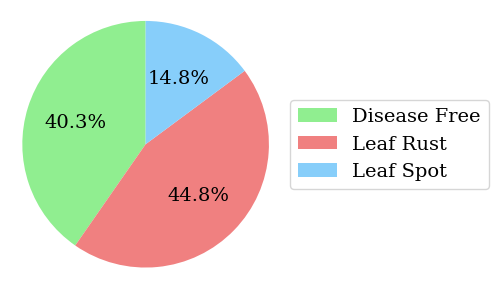

In [37]:
class_counts = []
for idx, dir_name in enumerate(listdir('/kaggle/input/mulberry-leaf-dataset/Mulberry Data')):
    img_paths = sorted([str(file_path) for file_path in Path(path.join('/kaggle/input/mulberry-leaf-dataset/Mulberry Data', dir_name)).iterdir() if file_path.suffix in ['.jpg', '.png', '.JPG', '.PNG']])
    print(f'Found {len(img_paths)} sample(s) for {DISPLAY_LABELS[idx]}')
    class_counts.append(len(img_paths))
    pass

# Plot the pie chart
plt.figure(figsize=(3.5, 3.5))
plt.pie(class_counts, autopct='%1.1f%%', startangle=90, colors=['lightgreen', 'lightcoral', 'lightskyblue'])
#plt.title('Class Distribution in Mulberry Leaf Dataset')
plt.legend(DISPLAY_LABELS, bbox_to_anchor=(1.8, 0.5), loc='right')
plt.axis('equal')
plt.show()


# 4. Display Samples

Samples from Disease Free:

/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/Healthy_1.jpg


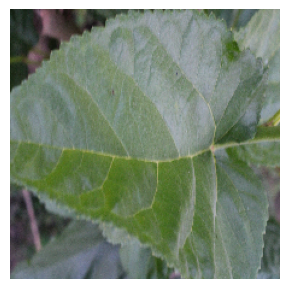

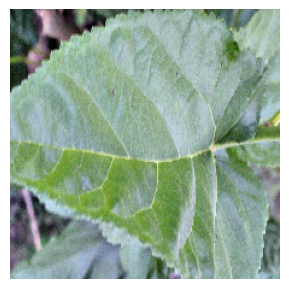


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/Healthy_13.jpg


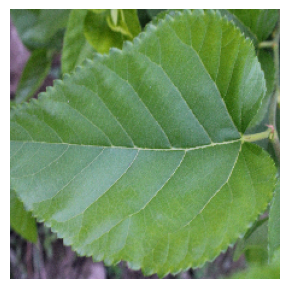

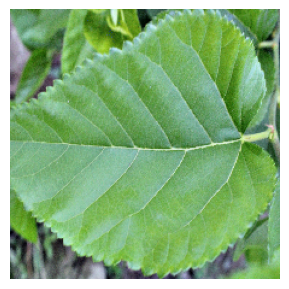


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/Healthy_18.jpg


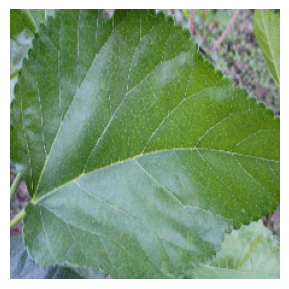

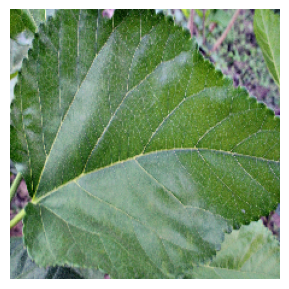


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/Healthy_3.jpg


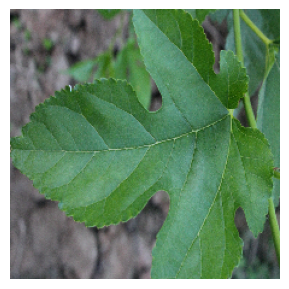

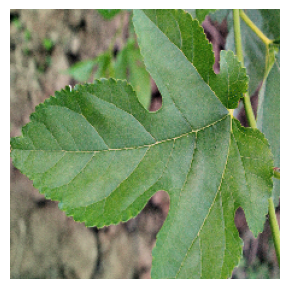


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/Healthy_8.jpg


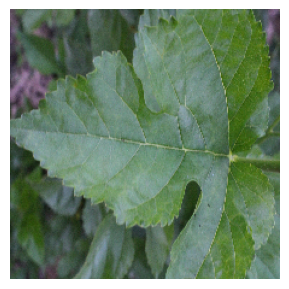

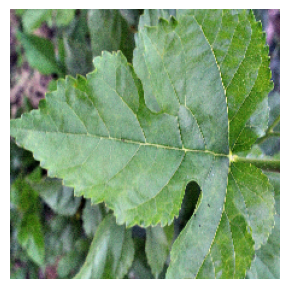


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/IMG_1646.JPG


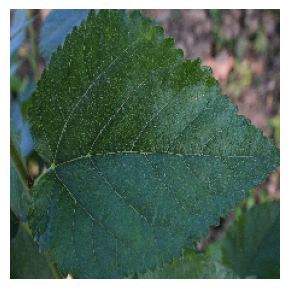

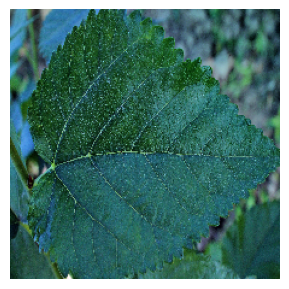


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/IMG_1650.JPG


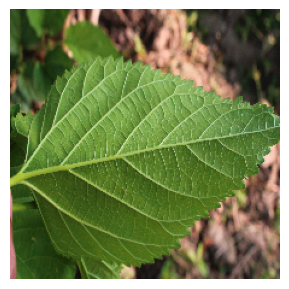

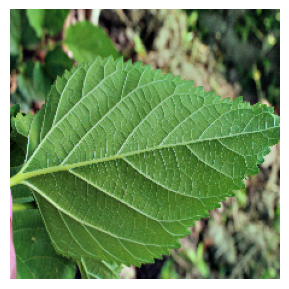


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/IMG_1654.JPG


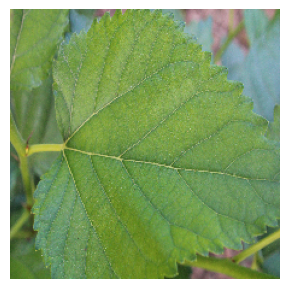

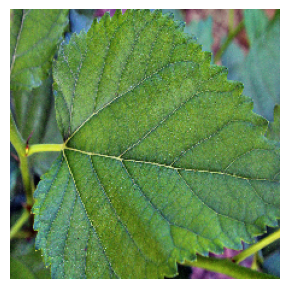


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/IMG_1658.JPG


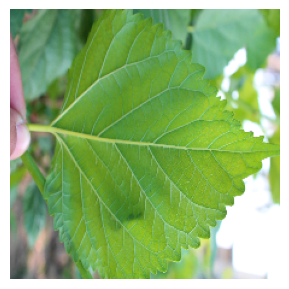

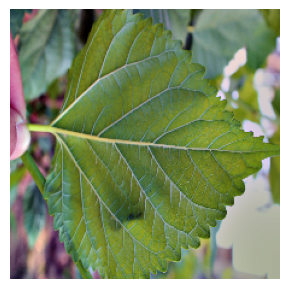


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Disease Free leaves/IMG_1662.JPG


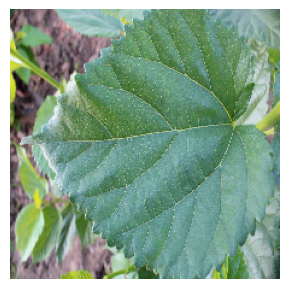

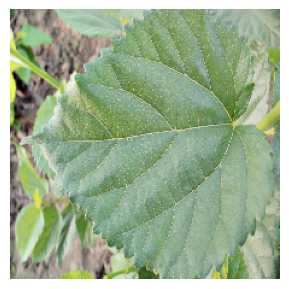


Samples from Leaf Rust:

/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1228.JPG


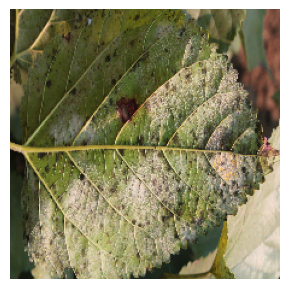

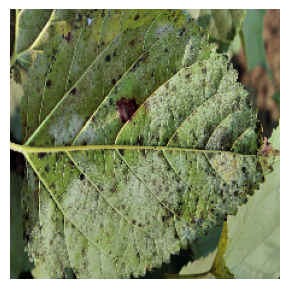


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1232.JPG


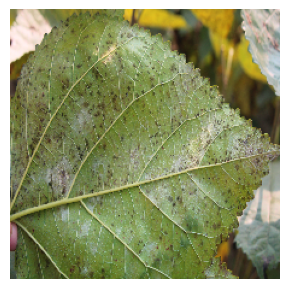

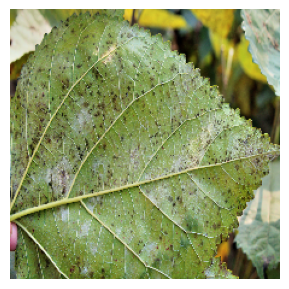


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1236.JPG


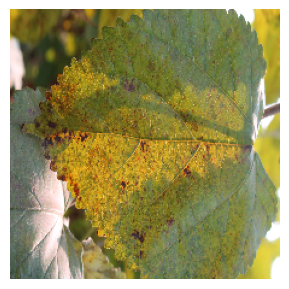

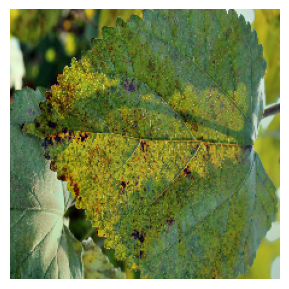


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1240.JPG


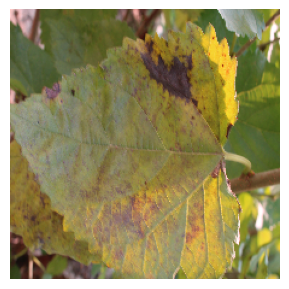

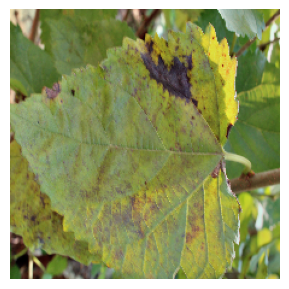


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1249.JPG


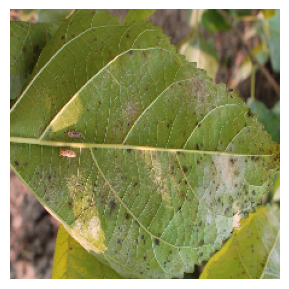

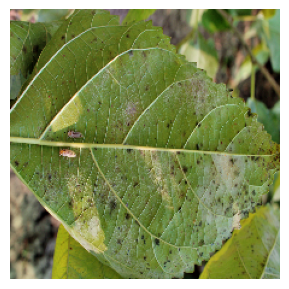


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1267.JPG


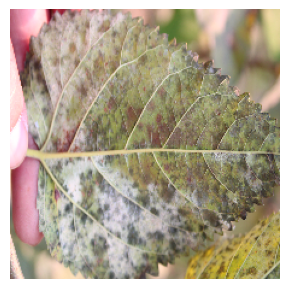

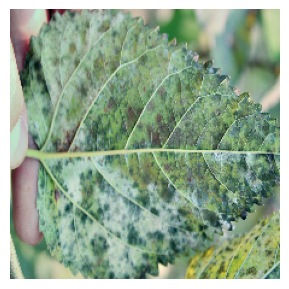


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1286.JPG


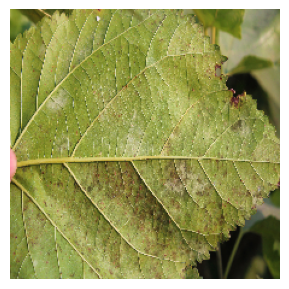

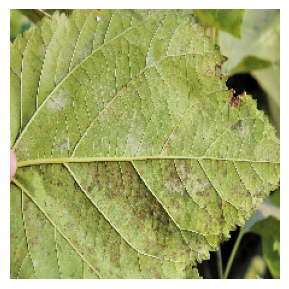


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1290.JPG


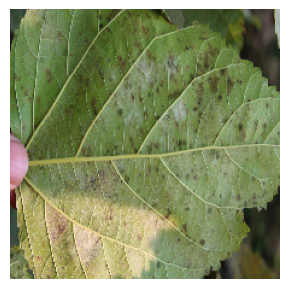

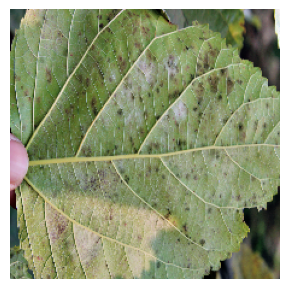


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1294.JPG


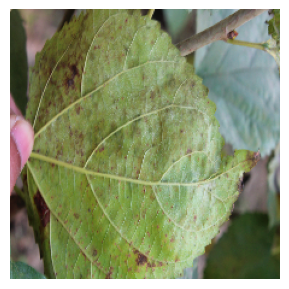

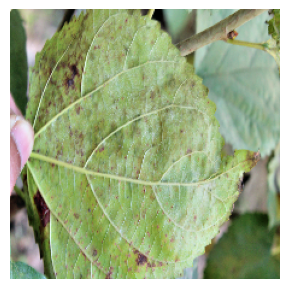


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf Rust/IMG_1300.JPG


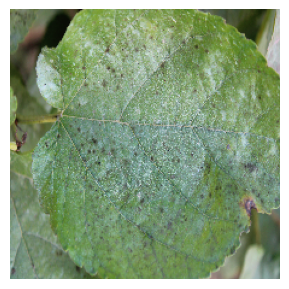

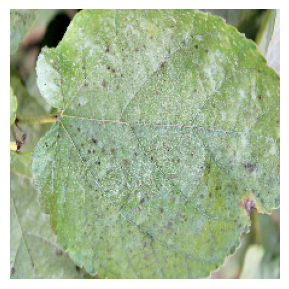


Samples from Leaf Spot:

/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0748.JPG


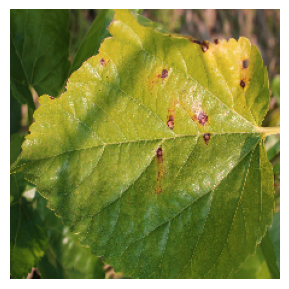

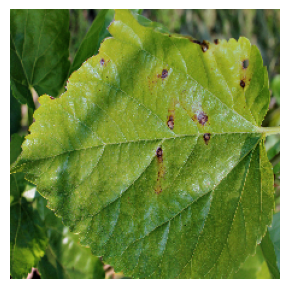


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0752.JPG


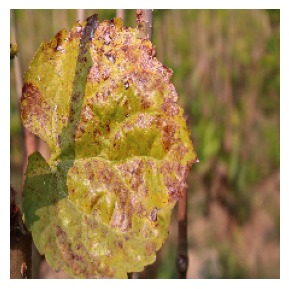

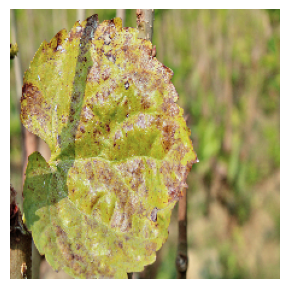


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0759.JPG


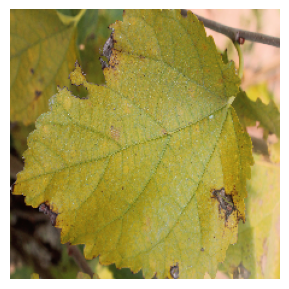

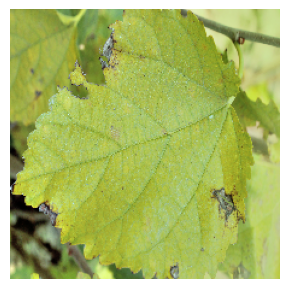


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0763.JPG


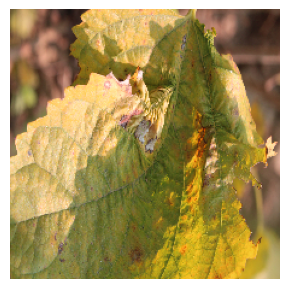

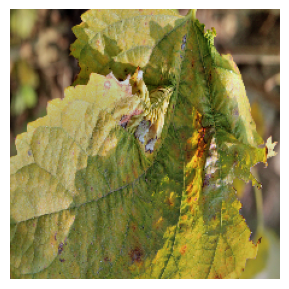


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0768.JPG


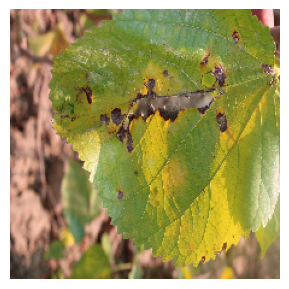

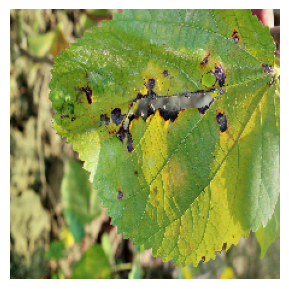


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0777.JPG


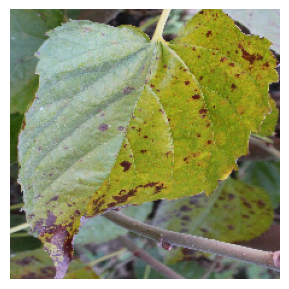

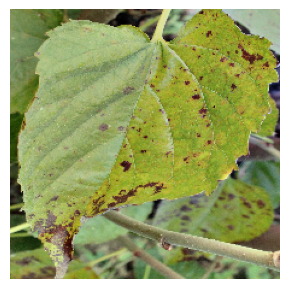


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0781.JPG


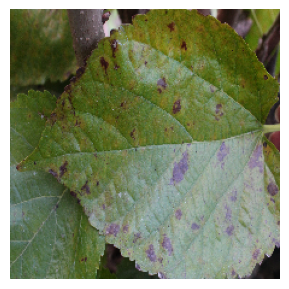

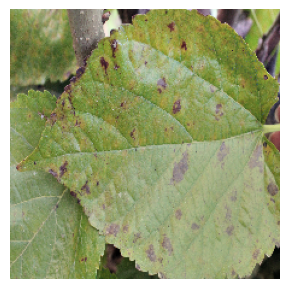


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0785.JPG


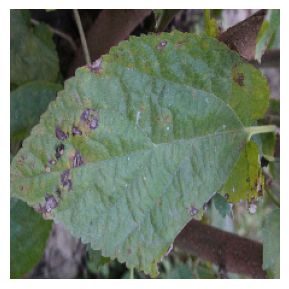

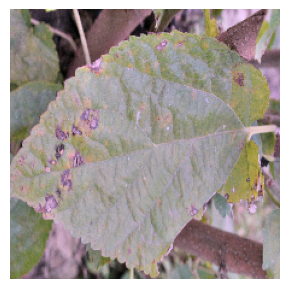


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0790.JPG


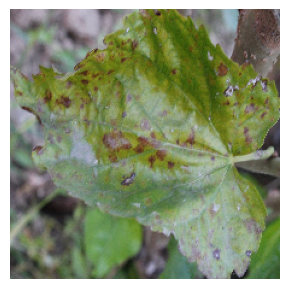

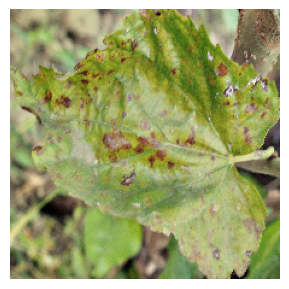


/kaggle/input/mulberry-leaf-dataset/Mulberry Data/Leaf spot/IMG_0799.JPG


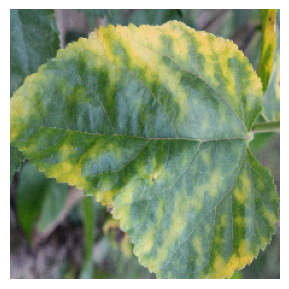

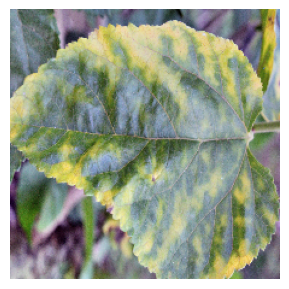

In [42]:
for idx, dir_name in enumerate(listdir('/kaggle/input/mulberry-leaf-dataset/Mulberry Data')):
    img_paths = sorted([str(file_path) for file_path in Path(path.join('/kaggle/input/mulberry-leaf-dataset/Mulberry Data', dir_name)).iterdir() if file_path.suffix in ['.jpg', '.png', '.JPG', '.PNG']])
    print(f'Samples from {DISPLAY_LABELS[idx]}:')
    print('')
    for img_path in img_paths[:40:4]:
        img = cv.imread(img_path, cv.IMREAD_UNCHANGED)
        if img is None:
            continue
        rsz_img = np.array(cv.resize(cv.cvtColor(img, cv.COLOR_BGR2RGB), (IMG_SIZE, IMG_SIZE)), dtype=np.uint8)
        msr_img = preprocess_with_msr(rsz_img)
        print(img_path)
        imshow([rsz_img])
        imshow([msr_img])
        print('')
        pass
